In [2]:
import urllib.request
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm

# 1) Download a CJK-capable font locally (no sudo needed)
font_dir = Path("./fonts")
font_dir.mkdir(exist_ok=True)
font_path = font_dir / "NotoSansCJK-Regular.ttc"

if not font_path.exists():
    urllib.request.urlretrieve(
        "https://github.com/googlefonts/noto-cjk/raw/main/Sans/OTC/NotoSansCJK-Regular.ttc",
        font_path
    )

# 2) Register + use it
fm.fontManager.addfont(str(font_path))
plt.rcParams["font.family"] = fm.FontProperties(fname=str(font_path)).get_name()
plt.rcParams["axes.unicode_minus"] = False


In [3]:
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import numpy as np
import json
import random

from process_childes import extract_utterances_by_age_and_adult_folder, clean_chinese_utterances_simple
#from sentence_transformers import SentenceTransformer
from collections import defaultdict
import numpy as np
from sklearn.decomposition import PCA
#from transformers import BertTokenizer, BertModel

#import torch

In [4]:
from load_embeddings import load_char_embeddings
char_embeddings_by_group = load_char_embeddings(input_dir="char_embeddings_january_2")


In [6]:
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np
import json

def plot_and_save_kmeans_clusters(group_data, group_name, agegroup, n_clusters=3):
    """
    group_data: {char: [(vec, utt), ...], ...}  (age-specific slice)
    Saves: kmeans_clusters_{agegroup}.json
    """

    embeddings = []
    char_labels = []
    utterances = []

    # Unpack (vec, utt) pairs
    for char, vecs in group_data.items():
        for vec, utt in vecs:
            embeddings.append(vec)
            char_labels.append(char)
            utterances.append(utt)

    if len(embeddings) < n_clusters:
        print(f"Not enough data for clustering in {group_name}")
        return

    embeddings = np.vstack(embeddings)

    # PCA (for visualization only)
    pca = PCA(n_components=2)
    reduced = pca.fit_transform(embeddings)

    # KMeans clustering (on original embeddings, like your original code)
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init='auto')
    cluster_labels = kmeans.fit_predict(embeddings)

    # Plot
    plt.figure(figsize=(6, 5))
    scatter = plt.scatter(
        reduced[:, 0], reduced[:, 1],
        c=cluster_labels, cmap='tab10', s=3, alpha=1
    )
    plt.title(f"PCA with Clusters - {group_name}")
    plt.grid(True)
    plt.ylim((-13, 13))
    plt.xlim((-20, 20))
    plt.colorbar(scatter, ticks=range(n_clusters), label='Cluster')
    plt.show()

    # Collect ALL utterances (no sampling) and save to JSON
    # Structure: {cluster_id: [{"character": ..., "utterance": ...}, ...], ...}
    cluster_data = {str(i): [] for i in range(n_clusters)}
    for cluster_id, char, utt in zip(cluster_labels, char_labels, utterances):
        cluster_data[str(int(cluster_id))].append({
            "character": char,
            "utterance": utt
        })

    out_path = f"kmeans_clusters_{agegroup}.json"
    with open(out_path, "w", encoding="utf-8") as f:
        json.dump(cluster_data, f, ensure_ascii=False, indent=2)

    print(f"Saved: {out_path}")
    return cluster_data


In [19]:
plot_and_save_kmeans_clusters(
    char_embeddings_by_group['child']['11'],
    "child age 11",
    agegroup="child age 11",
    n_clusters=10
)



AttributeError: 'list' object has no attribute 'items'

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def plot_sentence_lengths_by_age(data, target_chars):
    records = []

    # Children
    for age, utterances in data["child"].items():
        for utt in utterances:
            tokens = utt.strip().split()
            length = len(tokens)
            for char in target_chars:
                if char in tokens:
                    records.append({
                        "age": age,
                        "char": char,
                        "length": length
                    })

    # Adults
    for utt in data["adult"]:
        tokens = utt.strip().split()
        length = len(tokens)
        for char in target_chars:
            if char in tokens:
                records.append({
                    "age": "adult",
                    "char": char,
                    "length": length
                })

    df = pd.DataFrame(records)

    # Sort ages: numeric ages first, then 'adult' last
    age_order = sorted([a for a in df["age"].unique() if a != "adult"]) + ["adult"]
    df["age"] = pd.Categorical(df["age"], categories=age_order, ordered=True)

    for char in target_chars:
        plt.figure(figsize=(8, 5))
        sns.boxplot(data=df[df["char"] == char], x="age", y="length")
        plt.title(f"Sentence length by age for '{char}'")
        plt.ylabel("Length (words)")
        plt.xlabel("Age")
        plt.grid(True)
        plt.show()


NameError: name 'data' is not defined

In [20]:
from sklearn.cluster import DBSCAN
from sklearn.decomposition import PCA
import numpy as np
import matplotlib.pyplot as plt
import json

def plot_embeddings_pca_with_dbscan_and_save(
    group_data,
    group_name,
    agegroup,
    eps=0.1,
    min_samples=40
):
    # Flatten and label
    embeddings = []
    labels = []
    utterances = []

    for char, vecs in group_data.items():
        for vec, utt in vecs:
            embeddings.append(vec)
            labels.append(char)
            utterances.append(utt)

    if len(embeddings) < 2:
        print(f"Not enough embeddings for {group_name}")
        return

    embeddings = np.vstack(embeddings)

    # PCA
    pca = PCA(n_components=2)
    reduced = pca.fit_transform(embeddings)

    # DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit_predict(reduced)

    # Plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # PCA by character
    for char in sorted(set(labels)):
        idxs = [i for i, lbl in enumerate(labels) if lbl == char]
        ax1.scatter(reduced[idxs, 0], reduced[idxs, 1], label=char, s=3, alpha=1)

    ax1.set_title(f"PCA by Character - {group_name}")
    ax1.legend()
    ax1.set_ylim((-13, 13))
    ax1.set_xlim((-20, 20))
    ax1.grid(True)

    # DBSCAN clusters
    unique_clusters = np.unique(clusters)
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_clusters)))

    for cluster_id, color in zip(unique_clusters, colors):
        mask = clusters == cluster_id
        if cluster_id == -1:
            ax2.scatter(
                reduced[mask, 0], reduced[mask, 1],
                c="black", s=3, alpha=0.5, label="Noise"
            )
        else:
            ax2.scatter(
                reduced[mask, 0], reduced[mask, 1],
                c=[color], s=3, alpha=1, label=f"Cluster {cluster_id}"
            )

    ax2.set_title(f"DBSCAN Clusters - {group_name}")
    ax2.legend()
    ax2.set_ylim((-13, 13))
    ax2.set_xlim((-20, 20))
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

    # Save ALL utterances to JSON
    cluster_data = {}
    for cluster_id, char, utt in zip(clusters, labels, utterances):
        cluster_id = str(int(cluster_id))
        cluster_data.setdefault(cluster_id, []).append({
            "character": char,
            "utterance": utt
        })

    out_path = f"dbscan_clusters_{agegroup}.json"
    with open(out_path, "w", encoding="utf-8") as f:
        json.dump(cluster_data, f, ensure_ascii=False, indent=2)

    print(f"Saved: {out_path}")
    return fig, clusters, cluster_data


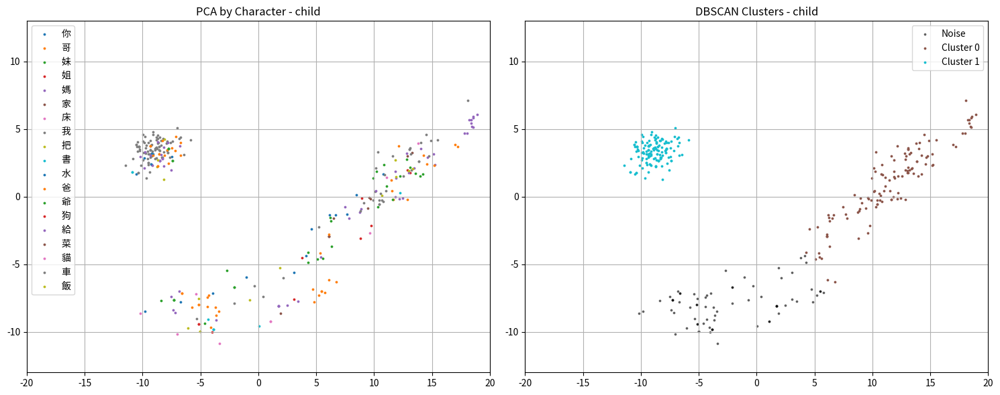

Saved: dbscan_clusters_child.json


(<Figure size 1500x600 with 2 Axes>,
 array([-1, -1,  0,  1, -1,  1, -1,  1, -1,  0,  0,  0,  0, -1,  0,  0,  1,
        -1,  1, -1,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0, -1,  0,  1, -1,
         1, -1,  1,  1,  0,  0,  0, -1,  0,  1,  1,  0, -1, -1, -1,  1,  0,
        -1,  0,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
         0,  1,  1,  1,  1,  1,  1,  1,  0,  0,  0,  1,  1,  0,  1,  1,  1,
         1,  0,  1,  1,  1, -1,  1,  1,  1,  1,  1,  1,  1,  1,  0,  1,  1,
         1,  1,  1,  1,  0, -1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,  1,
         1,  1,  1,  0,  0,  0,  1,  1,  1,  1,  1,  0,  1,  1,  1, -1,  1,
         1,  1,  1,  1,  1,  1,  1,  1,  1,  1, -1,  1,  0,  1,  1,  0,  1,
         1,  1,  0,  0, -1,  0,  0,  0,  0,  0, -1, -1, -1, -1,  0,  1,  1,
         1,  1,  1,  1, -1,  1,  1,  1, -1,  1,  1, -1, -1,  0,  1,  1,  1,
        -1,  1, -1, -1,  0,  0,  0,  1,  0,  1, -1,  1, -1,  1, -1, -1,  0,
         1, -1,  1,  0,  1, -1,  1, -1,  1, -1,  1,

In [32]:
plot_embeddings_pca_with_dbscan_and_save(
    char_embeddings_by_group['child']['0'],
    "child",
    agegroup="child",
    eps=4.5,
    min_samples=50
)


In [26]:
def plot_embeddings_pca_with_dbscan(group_data, group_name, eps=0.1, min_samples=40):
    # Flatten and label
    embeddings = []
    labels = []
    utterances = []
    
    for char, vecs in group_data.items():
        embeddings.extend([vec for vec, utt in vecs])
        labels.extend([char] * len(vecs))
        utterances.extend([utt for vec, utt in vecs])
    
    if len(embeddings) < 2:
        print(f"Not enough embeddings for {group_name}")
        return

    # Reduce dimensions
    pca = PCA(n_components=2)
    reduced = pca.fit_transform(np.vstack(embeddings))

    # Apply DBSCAN
    dbscan = DBSCAN(eps=eps, min_samples=min_samples)
    clusters = dbscan.fit_predict(reduced)

    # Plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Original plot by character
    ls = list(set(labels))
    ls.sort()
    for char in ls:
        idxs = [i for i, lbl in enumerate(labels) if lbl == char]
        ax1.scatter(reduced[idxs, 0], reduced[idxs, 1], label=char, s=3, alpha=1)
    ax1.set_title(f"PCA by Character - {group_name}")
    ax1.legend()
    ax1.set_ylim((-13,13))
    ax1.set_xlim((-20,20))
    ax1.grid(True)
    
    # DBSCAN clusters plot
    unique_clusters = np.unique(clusters)
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_clusters)))
    
    for cluster_id, color in zip(unique_clusters, colors):
        if cluster_id == -1:  # Noise points
            cluster_mask = clusters == cluster_id
            ax2.scatter(reduced[cluster_mask, 0], reduced[cluster_mask, 1], 
                       c='black', s=3, alpha=0.5, label='Noise')
        else:
            cluster_mask = clusters == cluster_id
            ax2.scatter(reduced[cluster_mask, 0], reduced[cluster_mask, 1], 
                       c=[color], s=3, alpha=1, label=f'Cluster {cluster_id}')
    
    ax2.set_title(f"DBSCAN Clusters - {group_name}")
    ax2.legend()
    ax2.set_ylim((-13,13))
    ax2.set_xlim((-20,20))
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()
    
    # Create JSON with all classifications
    cluster_data = {}
    for i, (utt, char, cluster_id) in enumerate(zip(utterances, labels, clusters)):
        if cluster_id not in cluster_data:
            cluster_data[cluster_id] = []
        cluster_data[cluster_id].append({"utterance": utt, "character": char})
    
    # Print 25 random examples per cluster
    print(f"\nCluster Examples for {group_name}:")
    print("=" * 50)
    
    for cluster_id in unique_clusters:
        cluster_items = cluster_data[cluster_id]
        
        if cluster_id == -1:
            print(f"\nNoise Points ({len(cluster_items)} points):")
        else:
            print(f"\nCluster {cluster_id} ({len(cluster_items)} points):")
        
        # Show up to 25 random examples
        sample_size = min(25, len(cluster_items))
        samples = random.sample(cluster_items, sample_size)
        
        for item in samples:
            print(f"  {item['character']}: {item['utterance']}")
        
        if len(cluster_items) > 25:
            print(f"  ... and {len(cluster_items) - 25} more")
    
    return fig, clusters, cluster_data


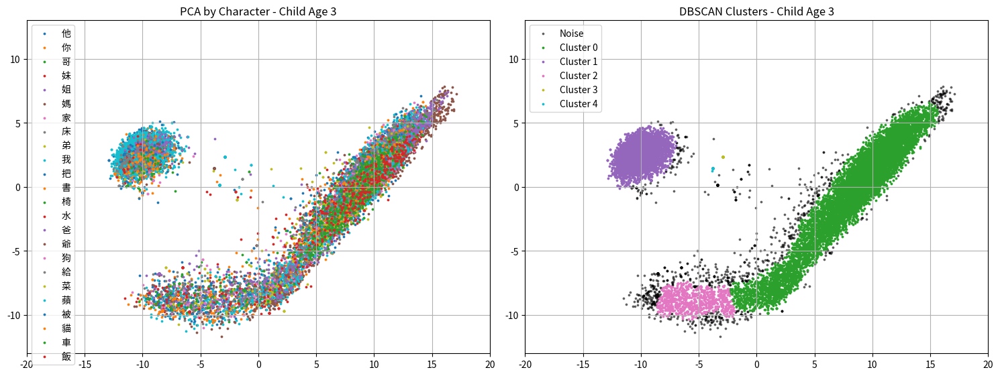


Cluster Examples for Child Age 3:

Noise Points (1018 points):
  爸: 爸爸
  媽: 媽媽 等 會
  菜: 是 菜
  妹: 妹妹
  爺: 爺爺 年紀 大 呀 嘴裡 缺 了 牙
  妹: 妹妹
  我: 我 家 我 幼兒園 可以 可以 搭 樂高
  把: 還 想 把
  媽: 那 是 爸爸 媽媽 給 我 買 的
  蘋: 蘋果
  爸: 因為 爸爸 在
  你: 祝 你 生日 快樂
  給: 幹嘛 給 我 亂 拼
  媽: 媽 你 舉 著 給 奶奶 看 我 的 樓 吧
  家: 我 家 有 超級 飛 俠 飛 俠 那 個 機器 人 噯
  家: 在 我 家 裡 面 看見 的
  爸: 我 爸爸 媽媽 也 喜歡 吃
  他: 叫 他 叫 我 阿 叫 我 媽媽 阿姨
  床: 起床
  我: 給 我 聽聽 聽聽
  他: 跟 他 的 媽媽 睡
  給: 給 給 個 獎品
  他: 請 他 坐 坐 的 這
  媽: 媽媽 在 幼兒園 的 旁邊 等 我
  車: 出 車禍 也 要 吃
  ... and 993 more

Cluster 0 (9853 points):
  水: 在 這 裡面 接 點 水
  媽: 熊 媽媽
  水: 要 澆 水
  你: 嚇一跳 你
  我: 嗯 就是 就是 我 愛 吃 雞蛋
  你: 說 說 說 你 都 有 照顧 小 貝貝
  哥: 它 是 哥哥
  他: 我 跟 他 也 買 過 那個
  弟: 是 我 弟弟 幫 我 打翻 的
  他: 穿 著 他 的 衣服
  媽: 像 白雪公主 的 媽媽 生病 死 了
  水: 嗯 在 買 水果 的 地方
  爺: 爺爺 奶奶 會 說 佩奇 喬治 的
  飯: 這 個 煮 飯飯 的
  爸: 我 爸爸 也 不 上班
  他: 豬 出來 看 他們 在 幹 什麼 東西
  給: 把 瓶子 給 弄 碎 了
  家: 老大 就 是 這 跟 家 婆 一樣
  車: 差點 我 就 翻 車 了
  媽: 那 媽媽 說 這 個 歪歪
  我: 媽媽 罵 我們
  車: 讓 修 車 的 叔叔 來
  菜: 還 有 胡蘿蔔 還 有 這 個 菜
  媽: 豬 媽媽
  水: 魚 兒 魚 兒 水 中 遊
  ... and 9828 more

Clu

In [27]:
fig, clusters, cluster_data = plot_embeddings_pca_with_dbscan(char_embeddings_by_group['child']['3'], "Child Age 3", eps=0.5, min_samples=50)





In [28]:
cluster_data

{-1: [{'utterance': '是 我 爺爺 家', 'character': '爺'},
  {'utterance': '因為 我 喜歡 爺爺', 'character': '爺'},
  {'utterance': '還 有 爺爺 奶奶', 'character': '爺'},
  {'utterance': '找到 爺爺 奶奶', 'character': '爺'},
  {'utterance': '爺爺', 'character': '爺'},
  {'utterance': '老爺爺', 'character': '爺'},
  {'utterance': '老爺爺', 'character': '爺'},
  {'utterance': '爺爺 他 聽 不 清', 'character': '爺'},
  {'utterance': '爺爺 年紀 大 呀 嘴裡 缺 了 牙', 'character': '爺'},
  {'utterance': '問 爺爺', 'character': '爺'},
  {'utterance': '是 我 爺爺 奶奶 買 的', 'character': '爺'},
  {'utterance': '爺爺 奶奶', 'character': '爺'},
  {'utterance': '爺爺', 'character': '爺'},
  {'utterance': '爺爺', 'character': '爺'},
  {'utterance': '換 他 了', 'character': '他'},
  {'utterance': '給 他', 'character': '他'},
  {'utterance': '是 他 頭頭', 'character': '他'},
  {'utterance': '幫 他 擦 藥藥', 'character': '他'},
  {'utterance': '就是 都 給 他', 'character': '他'},
  {'utterance': '換 他 了', 'character': '他'},
  {'utterance': '他 頭 在 是', 'character': '他'},
  {'utterance': '用 他 的 這 個', 'characte

/tmp/ipykernel_8545/3078341875.py:12: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data_to_plot, labels=labels)


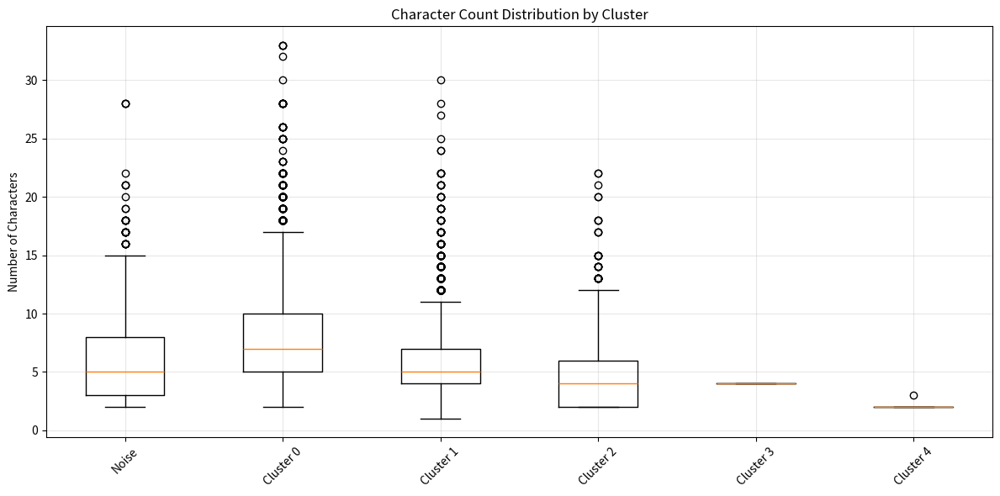

In [29]:
# Calculate character counts per sentence for each cluster
cluster_lengths = {}
for cluster_id, items in cluster_data.items():
    lengths = [len(item['utterance'].replace(' ', '')) for item in items]
    cluster_lengths[cluster_id] = lengths

# Create box plot
plt.figure(figsize=(12, 6))
data_to_plot = [cluster_lengths[cluster_id] for cluster_id in sorted(cluster_lengths.keys())]
labels = [f'Cluster {cluster_id}' if cluster_id != -1 else 'Noise' for cluster_id in sorted(cluster_lengths.keys())]

plt.boxplot(data_to_plot, labels=labels)
plt.ylabel('Number of Characters')
plt.title('Character Count Distribution by Cluster')
plt.xticks(rotation=45)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


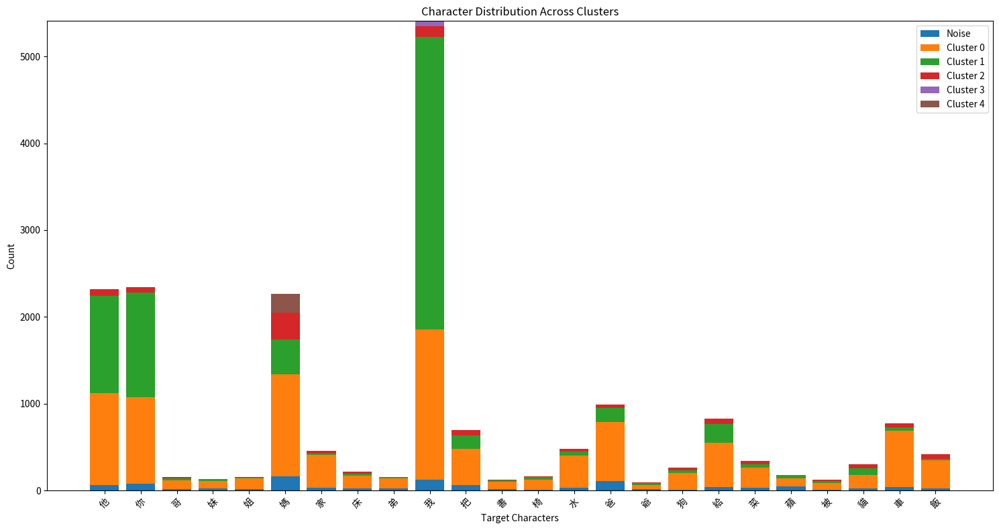

In [30]:
from collections import defaultdict

# Count characters by cluster
char_cluster_counts = defaultdict(lambda: defaultdict(int))
for cluster_id, items in cluster_data.items():
    for item in items:
        char_cluster_counts[item['character']][cluster_id] += 1

# Prepare data for stacked bar chart
characters = sorted(char_cluster_counts.keys())
cluster_ids = sorted(set(cluster_id for counts in char_cluster_counts.values() for cluster_id in counts.keys()))

# Create matrix for stacked bars
data_matrix = []
for cluster_id in cluster_ids:
    row = [char_cluster_counts[char][cluster_id] for char in characters]
    data_matrix.append(row)

# Plot stacked bar chart
fig, ax = plt.subplots(figsize=(15, 8))
bottom = [0] * len(characters)

for i, cluster_id in enumerate(cluster_ids):
    label = f'Cluster {cluster_id}' if cluster_id != -1 else 'Noise'
    ax.bar(characters, data_matrix[i], bottom=bottom, label=label)
    bottom = [b + d for b, d in zip(bottom, data_matrix[i])]

ax.set_xlabel('Target Characters')
ax.set_ylabel('Count')
ax.set_title('Character Distribution Across Clusters')
ax.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [33]:
from umap import UMAP
import hdbscan

In [34]:
def plot_embeddings_umap_with_hdbscan(group_data, group_name, n_neighbors=15, min_dist=0.1, min_cluster_size=40):
    # Flatten and label
    embeddings = []
    labels = []
    utterances = []
    
    for char, vecs in group_data.items():
        embeddings.extend([vec for vec, utt in vecs])
        labels.extend([char] * len(vecs))
        utterances.extend([utt for vec, utt in vecs])
    
    if len(embeddings) < 2:
        print(f"Not enough embeddings for {group_name}")
        return

    X = np.vstack(embeddings)

    # --- UMAP reduction to 2D ---
    reducer = UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=42)
    reduced = reducer.fit_transform(X)

    # --- HDBSCAN clustering ---
    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)
    clusters = clusterer.fit_predict(reduced)

    # --- Plotting ---
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # Plot by character
    ls = sorted(set(labels))
    for char in ls:
        idxs = [i for i, lbl in enumerate(labels) if lbl == char]
        ax1.scatter(reduced[idxs, 0], reduced[idxs, 1], label=char, s=3, alpha=1)
    ax1.set_title(f"UMAP by Character - {group_name}")
    ax1.legend()
    ax1.grid(True)
    
    # Plot clusters
    unique_clusters = np.unique(clusters)
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_clusters)))
    
    for cluster_id, color in zip(unique_clusters, colors):
        cluster_mask = clusters == cluster_id
        if cluster_id == -1:  # Noise
            ax2.scatter(reduced[cluster_mask, 0], reduced[cluster_mask, 1], 
                        c='black', s=3, alpha=0.5, label='Noise')
        else:
            ax2.scatter(reduced[cluster_mask, 0], reduced[cluster_mask, 1], 
                        c=[color], s=3, alpha=1, label=f'Cluster {cluster_id}')
    
    ax2.set_title(f"HDBSCAN Clusters - {group_name}")
    ax2.legend()
    ax2.grid(True)
    
    plt.tight_layout()
    plt.show()

    # --- Collect cluster data ---
    cluster_data = {}
    for utt, char, cluster_id in zip(utterances, labels, clusters):
        cluster_data.setdefault(cluster_id, []).append({"utterance": utt, "character": char})
    
    # --- Print examples ---
    print(f"\nCluster Examples for {group_name}:")
    print("=" * 50)
    
    for cluster_id in unique_clusters:
        cluster_items = cluster_data[cluster_id]
        if cluster_id == -1:
            print(f"\nNoise Points ({len(cluster_items)} points):")
        else:
            print(f"\nCluster {cluster_id} ({len(cluster_items)} points):")
        
        sample_size = min(25, len(cluster_items))
        samples = random.sample(cluster_items, sample_size)
        
        for item in samples:
            print(f"  {item['character']}: {item['utterance']}")
        
        if len(cluster_items) > 25:
            print(f"  ... and {len(cluster_items) - 25} more")
    
    return fig, clusters, cluster_data


/home/deborahwatty/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


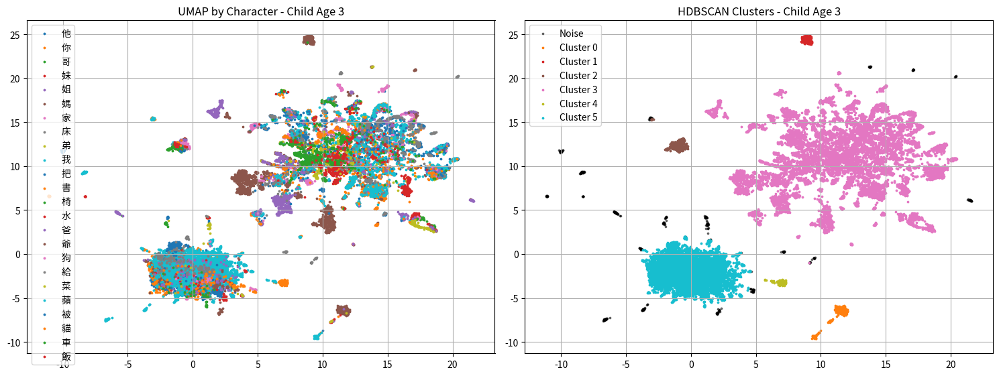


Cluster Examples for Child Age 3:

Noise Points (525 points):
  你: 我 教 你 畫 小 剪子 好 啊
  蘋: 蘋果
  你: 這樣子 我 就 可以 教 你 了
  你: 你
  飯: 飯
  我: 我 聞聞看
  爸: 爸爸
  蘋: 蘋果
  蘋: 蘋果
  我: 我
  蘋: 蘋果
  我: 我
  爸: 爸爸 健身
  我: 我 看看
  我: 我 也 不 知道
  我: 我
  我: 我 也 不 知道
  水: 水
  他: 他
  媽: 媽
  我: 我
  菜: 菜
  我: 我
  貓: 貓
  我: 我 也 不 知道
  ... and 500 more

Cluster 0 (306 points):
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  菜: 菜花
  我: 我 不 知道
  媽: 媽媽
  媽: 媽媽
  我: 我 不 知道
  水: 水果
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  我: 我 不 知道
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  我: 我 想一想
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  ... and 281 more

Cluster 1 (217 points):
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  媽: 媽媽
  ... and 192 more

Cluster 2 (286 points):
  狗: 小的 狗狗 大的 狗狗
  書: 我們 來 看 船 的 書
  飯: 就是 別的 飯菜
  家: 躲 到 他 的 家 去 了
  床: 這 是 他 的 床
  家: 看 我 找到 他 的 家 了 嘛
  水: 領 我 在 可 安歇 的 水 邊
  車: 我 的 我 的 車 在
  爸:

In [35]:
fig, clusters, cluster_data = plot_embeddings_umap_with_hdbscan(
    char_embeddings_by_group['child']['3'], 
    "Child Age 3", 
    n_neighbors=15, 
    min_dist=0.5, 
    min_cluster_size=100
)

/home/deborahwatty/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/tmp/ipykernel_8545/1386469192.py:55: UserWarning: Tight layout not applied. The bottom and top margin

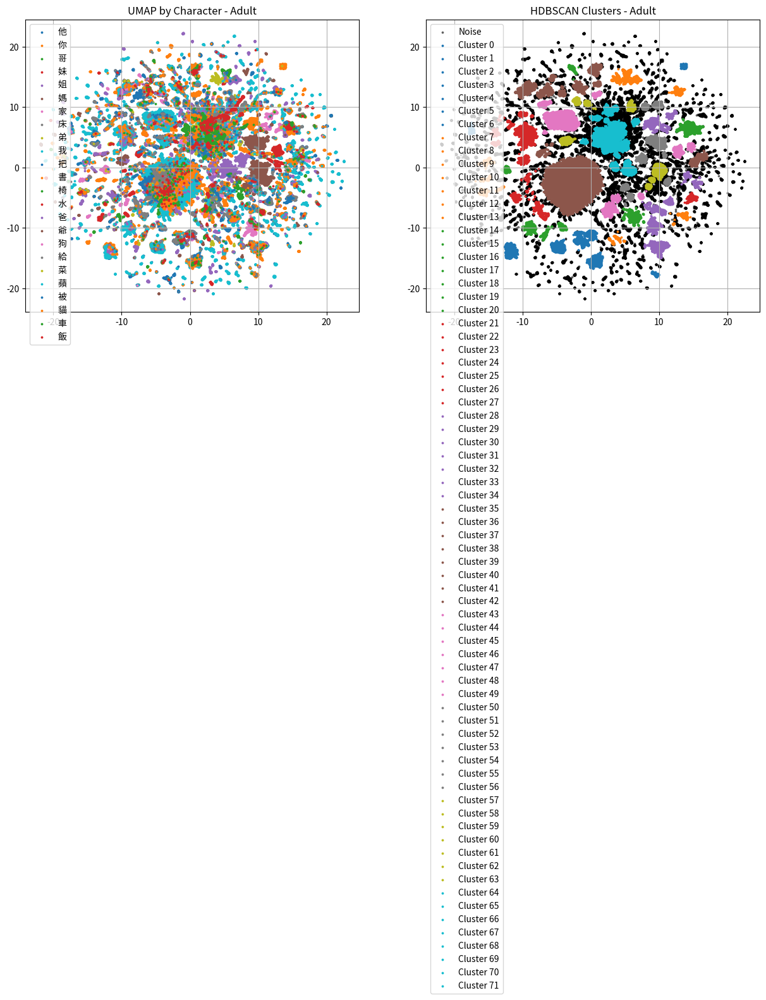


Cluster Examples for Adult:

Noise Points (58887 points):
  我: 需要 木頭 才 可以 把 桌子 做成 我們 想 要 的 桌子
  我: 來 接 我們 吶
  我: 給 我
  貓: 好 我們 講 一下 這 個 人 她 為什麼 要 尋貓啟事 啊
  他: 可是 蜘蛛 有沒有 回答 他 呢
  他: 你 要 像 醫生 這樣 聽 一下 他 的 肚子 啊
  書: 我 的 弟弟 啊 小時候 我 很 喜歡 看 故事 書
  你: 這 一 關 呢 只要 你 說 四 件 事情 給 姊姊 聽 你 就 過關 了 可不可以
  媽: 我 媽媽 在 這 段 時間 他 台語 進步 很 多
  爸: 我 去 扔 垃圾 時 爸爸 一定 要 遠遠地 保護 我
  你: 好的 接下來 呢 你 想 放 什麼
  我: 我 不 想 讓 那裏 的 大 妖怪 覺得 我 原諒 他們 了
  你: 你
  他: 哇 一 個 小 男孩 他 的 想象力 很 豐富
  他: 他 是 誰
  媽: 吃 晚飯 的時候 我 跟 爸爸 媽媽 說 我 要 去 學 空手道
  爸: 我 去 扔 垃圾 時 一定 要 爸爸 遠遠地 保護 我
  你: 你 看看
  我: 我 的 房間 裡 也 藏 著 大 妖怪
  你: 喔 好 你 講 得 好棒 喔
  媽: 這 爸爸 可 真 胖 啊 那 豬 媽媽 呢
  飯: 我們 畫 煮飯 的 好不好
  我: 我 甚至 敢 睡 在 下 鋪 了
  我: 我 知道
  媽: 嗯 大概 吧 媽媽 也 沒 玩 過 這 個 啊
  ... and 58862 more

Cluster 0 (964 points):
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  你: 你 看
  ... and 939 more

Cluster 1 (2263 poi

In [38]:
fig, clusters, cluster_data = plot_embeddings_umap_with_hdbscan(
    char_embeddings_by_group['adult'], 
    "Adult", 
    n_neighbors=15, 
    min_dist=0.5, 
    min_cluster_size=350
)

In [ ]:
fig

In [ ]:
import json

with open("cluster_data.json", "w", encoding="utf-8") as f:
    json.dump(cluster_data, f, ensure_ascii=False, indent=2)


In [40]:
char_embeddings_by_group['child']['3']['爺'][0]

(array([ 8.70681584e-01, -4.82118875e-02, -3.65555704e-01, -8.74828756e-01,
         5.92756331e-01, -1.65582761e-01, -2.26327091e-01, -1.08659819e-01,
        -3.86070073e-01,  2.57427126e-01, -1.71083227e-01, -1.27536774e-01,
         2.17671692e-01,  4.45040673e-01,  4.46491778e-01, -1.34508836e+00,
         5.33008039e-01,  8.14901471e-01, -8.32006633e-02,  5.17172694e-01,
         4.70522642e-01,  6.51435256e-02, -8.03552389e-01,  1.83960348e-01,
         1.50254571e+00,  2.19311565e-01, -3.65918279e-01, -1.24963260e+00,
         1.20986235e+00,  1.40104079e+00, -8.16295862e-01, -1.01852491e-02,
        -1.08791852e+00, -7.47938156e-01, -7.01151311e-01, -2.43404672e-01,
         1.00783134e+00, -3.55193675e-01, -6.41353846e-01, -3.12392637e-02,
        -2.62984008e-01,  6.97801292e-01,  3.67981017e-01, -6.14471495e-01,
         6.02359653e-01,  2.37744465e-01, -5.63062906e-01,  3.39189500e-01,
        -3.30096662e-01,  3.70035410e-01,  7.66682386e-01,  1.08400021e+01,
         5.1

In [42]:
import copy
char_embeddings_by_group_copy = copy.deepcopy(char_embeddings_by_group)

In [47]:
for age_str, char_dict in char_embeddings_by_group_copy["child"].items(): 
    for char, entries in char_dict.items():
        char_dict[char] = [(emb, sent, age_str) for emb, sent in entries]


ValueError: too many values to unpack (expected 2)

In [48]:

for char, entries in char_embeddings_by_group_copy["adult"].items():
    char_embeddings_by_group_copy["adult"][char] = [
        (emb, sent, "adult") for emb, sent in entries
    ]


In [49]:
char_embeddings_by_group_copy["adult"]["爺"][0]

(array([ 2.56847322e-01, -4.57956754e-02, -7.99257994e-01,  4.19470131e-01,
         3.90815139e-01, -6.26515210e-01, -5.30897856e-01,  5.39912999e-01,
        -5.02014875e-01,  2.34677345e-01, -2.33024836e-01, -5.39189875e-01,
        -8.19343388e-01,  3.89894128e-01,  6.65084064e-01, -1.27286839e+00,
         7.94560194e-01,  9.21927810e-01,  7.35092610e-02,  9.03599560e-01,
         2.05611795e-01,  7.98761725e-01, -6.51160255e-02,  5.69859326e-01,
         1.48417246e+00, -1.05318522e+00, -3.00322413e-01, -7.97596157e-01,
         9.08567667e-01,  7.80008852e-01, -1.14711070e+00,  1.05567348e+00,
        -7.87809432e-01, -9.11610723e-01, -8.33813429e-01,  8.76589119e-01,
         2.19039530e-01, -2.63312250e-01, -1.34259045e+00, -2.14902535e-01,
        -2.66176432e-01,  6.75529480e-01,  8.55598450e-02,  1.90734416e-01,
         6.62270248e-01, -6.82536721e-01, -5.58572710e-01, -4.75987494e-02,
         1.88092291e-01, -3.08774710e-02,  4.78261590e-01,  9.22373009e+00,
         6.8

In [50]:
from collections import defaultdict

flat_char_embeddings = defaultdict(list)

# --- child ---
for age_str, char_dict in char_embeddings_by_group_copy["child"].items():
    for char, entries in char_dict.items():
        flat_char_embeddings[char].extend(entries)

# --- adult ---
for char, entries in char_embeddings_by_group_copy["adult"].items():
    flat_char_embeddings[char].extend(entries)

flat_char_embeddings = dict(flat_char_embeddings)


In [51]:
flat_char_embeddings['爺'][0]


(array([-7.56777763e-01,  9.41621602e-01,  4.79444832e-01,  1.64959773e-01,
        -1.25158563e-01, -7.97734201e-01,  2.60113254e-02,  2.59736985e-01,
        -7.64526129e-01,  7.10469127e-01,  5.92052162e-01, -8.53868067e-01,
         1.13890433e+00, -2.46486887e-01,  8.90802205e-01, -5.53681374e-01,
         5.52342415e-01, -3.88641238e-01,  4.02742237e-01, -2.31239438e-01,
         1.64141804e-01,  8.35317731e-01, -4.74866956e-01, -2.77355671e-01,
         9.52093750e-02, -1.72778927e-02, -1.30940184e-01,  5.00742346e-03,
         2.94064075e-01,  4.23974574e-01,  9.40125585e-01, -8.67109299e-01,
        -4.28164512e-01,  4.63375688e-01,  5.09554327e-01, -7.80981064e-01,
         9.45593178e-01,  4.36029732e-01,  2.71741986e-01, -8.40618610e-01,
         3.27917635e-01,  8.32021415e-01, -1.25080168e+00,  6.26648724e-01,
         6.06506407e-01,  2.18943328e-01,  1.92023665e-02,  1.10239553e+00,
        -1.25615633e+00,  4.70605910e-01,  1.38325244e-01,  1.02204924e+01,
         6.6

In [52]:
def plot_embeddings_umap_with_hdbscan(
    group_data, 
    group_name, 
    n_neighbors=15, 
    min_dist=0.1, 
    min_cluster_size=40
):
    # group_data: {char: [(vec, utt, age_tag), ...], ...}

    # Flatten and label
    embeddings = []
    labels = []
    utterances = []
    ages = []

    for char, vecs in group_data.items():
        embeddings.extend([vec for vec, utt, age in vecs])
        labels.extend([char] * len(vecs))
        utterances.extend([utt for vec, utt, age in vecs])
        ages.extend([age for vec, utt, age in vecs])

    if len(embeddings) < 2:
        print(f"Not enough embeddings for {group_name}")
        return

    X = np.vstack(embeddings)

    # --- UMAP reduction to 2D ---
    reducer = UMAP(n_neighbors=n_neighbors, min_dist=min_dist, n_components=2, random_state=42)
    reduced = reducer.fit_transform(X)

    # --- HDBSCAN clustering ---
    clusterer = hdbscan.HDBSCAN(min_cluster_size=min_cluster_size)
    clusters = clusterer.fit_predict(reduced)

    # --- Plotting ---
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    # Plot by character
    ls = sorted(set(labels))
    for char in ls:
        idxs = [i for i, lbl in enumerate(labels) if lbl == char]
        ax1.scatter(reduced[idxs, 0], reduced[idxs, 1], label=char, s=3, alpha=1)
    ax1.set_title(f"UMAP by Character - {group_name}")
    ax1.legend()
    ax1.grid(True)

    # Plot clusters
    unique_clusters = np.unique(clusters)
    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_clusters)))

    for cluster_id, color in zip(unique_clusters, colors):
        cluster_mask = clusters == cluster_id
        if cluster_id == -1:  # Noise
            ax2.scatter(
                reduced[cluster_mask, 0], reduced[cluster_mask, 1],
                c='black', s=3, alpha=0.5, label='Noise'
            )
        else:
            ax2.scatter(
                reduced[cluster_mask, 0], reduced[cluster_mask, 1],
                c=[color], s=3, alpha=1, label=f'Cluster {cluster_id}'
            )

    ax2.set_title(f"HDBSCAN Clusters - {group_name}")
    ax2.legend()
    ax2.grid(True)

    plt.tight_layout()
    plt.show()

    # --- Collect cluster data (now includes age) ---
    cluster_data = {}
    for utt, char, age, cluster_id in zip(utterances, labels, ages, clusters):
        cluster_data.setdefault(cluster_id, []).append({
            "utterance": utt,
            "character": char,
            "age": age
        })

    # --- Print examples ---
    print(f"\nCluster Examples for {group_name}:")
    print("=" * 50)

    for cluster_id in unique_clusters:
        cluster_items = cluster_data[cluster_id]
        if cluster_id == -1:
            print(f"\nNoise Points ({len(cluster_items)} points):")
        else:
            print(f"\nCluster {cluster_id} ({len(cluster_items)} points):")

        sample_size = min(25, len(cluster_items))
        samples = random.sample(cluster_items, sample_size)

        for item in samples:
            print(f"  {item['character']} [{item['age']}]: {item['utterance']}")

        if len(cluster_items) > 25:
            print(f"  ... and {len(cluster_items) - 25} more")

    return fig, clusters, cluster_data


/home/deborahwatty/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deborahwa

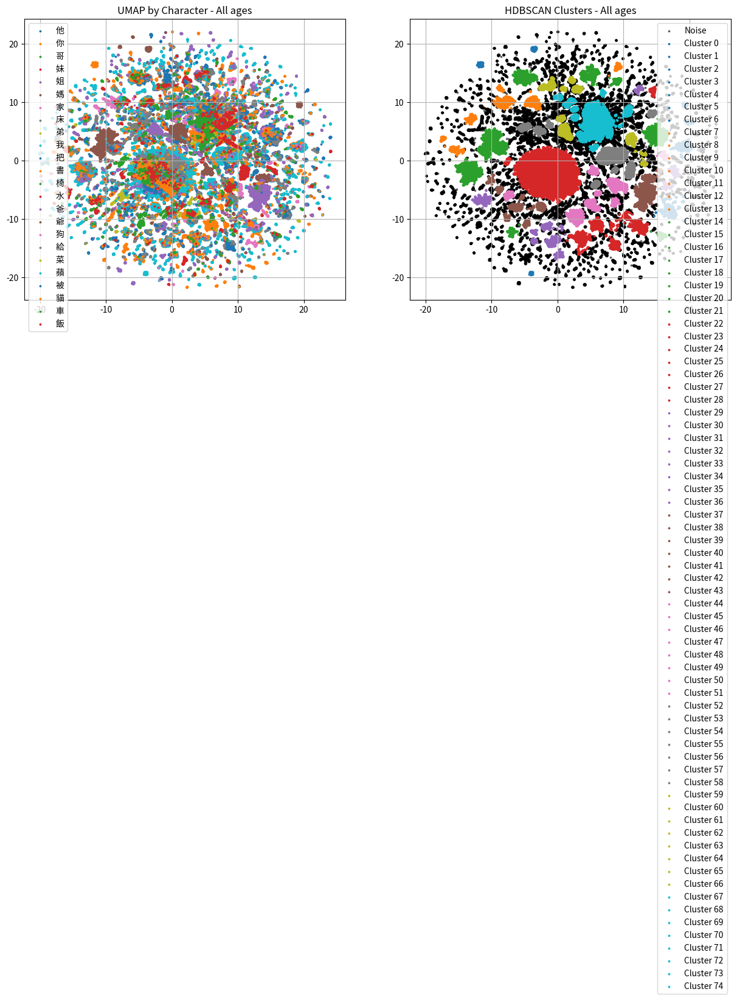


Cluster Examples for All ages:

Noise Points (89902 points):
  我 [adult]: 我 來 我 來
  你 [adult]: 你 記不記得
  我 [5]: 對 就 像 我們 家 爸爸
  爸 [adult]: 爸爸 媽媽 說 哎 什麼 聲音 在 響 呀 真 奇怪
  蘋 [adult]: 什麼 味道 的 呀 蘋果
  他 [6]: 想 玩 他們 就 拿
  家 [adult]: 啊 人家 是 買 那 玩具 什麼
  我 [adult]: 我 跟 你 說 喔
  我 [adult]: 這 說明 我 也 可以 學 啦
  我 [5]: 小 女孩 我 給
  你 [adult]: 那 你 有沒有 看 過 你 兩 個 姐姐 吵架
  爸 [adult]: 我 扛 起 垃圾 沒有 叫 爸爸 保護 我
  車 [4]: 是 人 他 在 騎 摩托車
  把 [6]: 還 可以 把 人 變 漂亮 變 聰明
  我 [adult]: 可 我 從來 不 去 那裏
  你 [adult]: 你 忘記 我 了
  我 [adult]: 沒關係 我們 拿 一 張 紙 擦一擦
  水 [5]: 嗯 像 水 的 那 種 一樣的
  弟 [5]: 弟弟 喬治
  他 [adult]: 要不然 他 可能 會 回不來
  媽 [1]: 媽媽 雨刷
  他 [adult]: 他們 覺得 這 個 主意 不錯
  我 [5]: 我 家 藏 著 一 個 大 妖怪
  我 [adult]: 因為 我 決心 一路 要 拿 到 黑 帶
  我 [adult]: 我 的 家 裡 到處 藏 有 大 妖怪
  ... and 89877 more

Cluster 0 (1305 points):
  你 [2]: 你 看
  你 [adult]: 你 看
  你 [adult]: 你 看
  你 [5]: 你 看
  你 [adult]: 你 看
  你 [adult]: 你 看
  你 [adult]: 你 看
  你 [adult]: 你 看
  你 [adult]: 你 看
  你 [adult]: 你 看
  你 [adult]: 你 看
  你 [adult]: 你 看
  你 [5]: 你 看
  你 [adult]: 你 看
  你 [a

In [53]:
fig, clusters, cluster_data = plot_embeddings_umap_with_hdbscan(
    flat_char_embeddings, 
    "All ages", 
    n_neighbors=15, 
    min_dist=0.5, 
    min_cluster_size=500
)

In [ ]:
fig, clusters, cluster_data = plot_embeddings_umap_with_hdbscan(
    flat_char_embeddings, 
    "All ages", 
    n_neighbors=15, 
    min_dist=0.5, 
    min_cluster_size=500
)

In [54]:
import json

with open("cluster_data.json", "w", encoding="utf-8") as f:
    json.dump(cluster_data, f, ensure_ascii=False, indent=2)


TypeError: keys must be str, int, float, bool or None, not int64

In [55]:
cluster_data_json = {
    str(cluster_id): items
    for cluster_id, items in cluster_data.items()
}

with open("cluster_data.json", "w", encoding="utf-8") as f:
    json.dump(cluster_data_json, f, ensure_ascii=False, indent=2)


/home/deborahwatty/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/tmp/ipykernel_8545/844036068.py:69: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


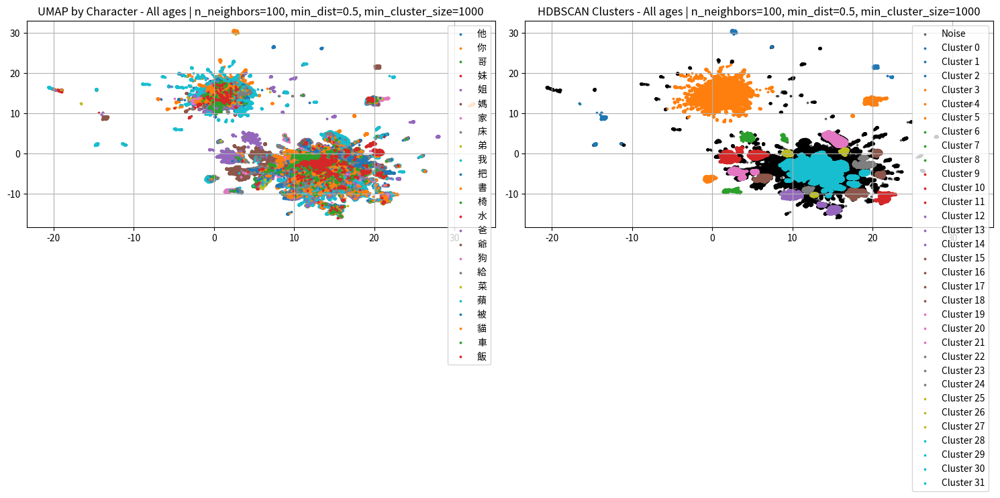


Cluster Examples for All ages | n_neighbors=100, min_dist=0.5, min_cluster_size=1000:

Noise Points (77246 points):
  爺 [5]: 喂 原來 是 熊 爺爺
  你 [adult]: 那 這麼 多 客人 你 請 到 家 裡 了 嗎
  我 [adult]: 可青 聲音 小 一點 我 在 錄音
  媽 [adult]: 然後 我 媽媽 就 帶 我 去 看 醫生
  我 [adult]: 乖乖 你 都 不等 我 哈
  我 [5]: 可是 我 卻 很 擔心
  我 [6]: 不然 不然 的話 我 也許 就 回不來 了
  把 [adult]: 我 把 桌子 擺 好
  爸 [adult]: 爸爸 的 樣子 很 輕鬆
  家 [4]: 佩奇 找 的 是 小 貓 過 家家
  蘋 [adult]: 你 看 吃 蘋果 的時候 蘋果 裡面 是不是 那 個 那 個 中間 呢 有 那 個 籽
  書 [adult]: 咦 這 本 書 真 奇怪
  我 [adult]: 昨天 我 肚子 痛 啊
  被 [adult]: 來 拿 起 小 被子
  媽 [5]: 然後 豬 媽媽 再 把 這 些 用具 都 放 到 了 這 張 小 桌子 上
  我 [6]: 哦 對 我 喜歡 吃
  你 [adult]: 果 兒 你 猜猜 看
  媽 [adult]: 那 豬 媽媽 住 在 哪 一 樓
  他 [adult]: 今天 中午 他們 要 做 一 頓 大餐
  我 [adult]: 我 知道 大 妖怪 們 就 在 外面 等 著 我
  你 [adult]: 不然 你 要 怎麼 拼
  把 [adult]: 媽媽 把 書 念 給 你 聽 好 吧
  哥 [adult]: 你 說 哥 倆 好 啊
  媽 [5]: 爸爸 媽媽
  媽 [1]: 媽媽 給 比
  ... and 77221 more

Cluster 0 (1665 points):
  媽 [adult]: 媽媽
  媽 [3]: 媽媽
  蘋 [6]: 蘋果
  媽 [1]: 媽媽
  蘋 [4]: 蘋果
  蘋 [5]: 蘋果
  媽 [2]: 媽媽
  蘋 [4]: 蘋果
  蘋 [4]: 蘋果
  媽 [2]:

(<Figure size 1500x600 with 2 Axes>,
 array([-1, 31, -1, ..., 31, 31, 31]),
 {-1: [{'utterance': '老爺 跳', 'character': '爺', 'age': '0'},
   {'utterance': '喊 爺爺 來 拔', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '還 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '海豹 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '還有 爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '謝謝 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '謝謝 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '吃 老爺爺 吃 阿姨', 'character': '爺', 'age': '0'},
   {'utterance': '吃 老爺爺 吃 阿姨', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '1'},
   {'utterance': '爺爺', 'character': '爺', 'age': '1'},
   {'utt

In [56]:
# 1) Much more global UMAP, large clusters only
plot_embeddings_umap_with_hdbscan(
    flat_char_embeddings,
    "All ages | n_neighbors=100, min_dist=0.5, min_cluster_size=1000",
    n_neighbors=100,
    min_dist=0.5,
    min_cluster_size=1000
)

/home/deborahwatty/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/tmp/ipykernel_8545/844036068.py:69: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


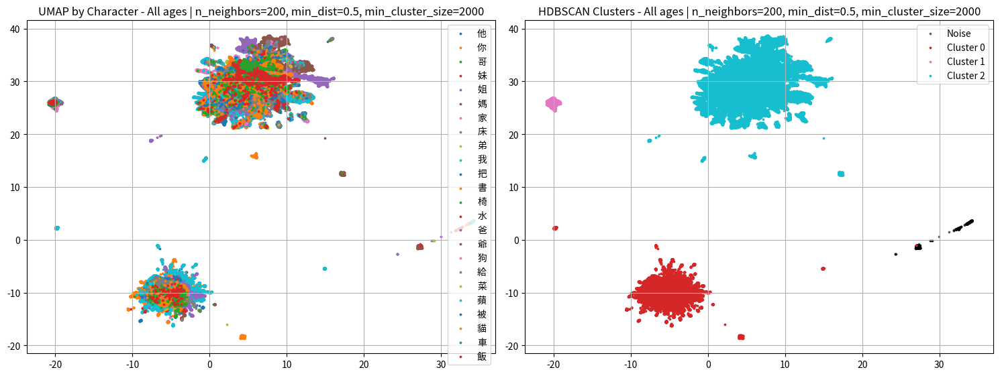


Cluster Examples for All ages | n_neighbors=200, min_dist=0.5, min_cluster_size=2000:

Noise Points (1731 points):
  媽 [2]: 媽媽
  媽 [1]: 媽媽
  媽 [2]: 媽媽
  媽 [1]: 媽媽
  你 [adult]: 你 想一想
  媽 [4]: 媽媽
  媽 [1]: 媽媽
  媽 [2]: 媽媽
  我 [4]: 我 不 知道
  媽 [3]: 媽媽
  我 [3]: 我 不 知道
  媽 [3]: 媽媽
  媽 [3]: 媽媽
  你 [adult]: 你 看 電視 裡面
  飯 [5]: 飯桌
  媽 [3]: 媽媽
  我 [adult]: 我 就 知道
  媽 [1]: 媽媽
  我 [adult]: 我 知道
  媽 [5]: 媽媽
  媽 [1]: 媽媽
  媽 [3]: 媽媽
  水 [3]: 水草
  媽 [adult]: 媽媽
  媽 [4]: 媽媽
  ... and 1706 more

Cluster 0 (102883 points):
  他 [6]: 他 就 走 了
  他 [6]: 他 生氣 了
  我 [1]: 我 問 小 燕子 你 為 啥 來
  你 [3]: 你 的 書 就 掉 下去 了
  你 [adult]: 你 搞 錯 了
  他 [6]: 他 不 說話
  他 [adult]: 他 就 握 著 拳頭 要 打 它
  我 [4]: 我 自己 也 想 看
  我 [adult]: 我 回去 囉
  你 [adult]: 你 好
  你 [adult]: 你 剛才 說 什麼
  他 [adult]: 他 希望 大 妖怪 站 得 離 他 近 一點
  我 [adult]: 我 去 拿 睡衣 時 一定 要 媽媽 陪 著
  你 [adult]: 你 還 記 得 啊
  我 [adult]: 我們 來 裝飾 一下 吧
  爸 [5]: 爸爸 媽媽 覺得 這 個 主意 非常 不錯
  蘋 [5]: 蘋果 橘子
  你 [5]: 你 在 幹嘛
  你 [adult]: 你 眼睛 有沒有 在 看
  我 [adult]: 我們 先 找 邊邊 幫 他們 找到 家 好 嗎
  你 [2]: 你 是 老師


(<Figure size 1500x600 with 2 Axes>,
 array([2, 2, 2, ..., 2, 2, 2]),
 {2: [{'utterance': '老爺 跳', 'character': '爺', 'age': '0'},
   {'utterance': '喊 爺爺 來 拔', 'character': '爺', 'age': '0'},
   {'utterance': '喊 爺爺 來 拔', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '還 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '還 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '海豹 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '海豹 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '啊 爺', 'character': '爺', 'age': '0'},
   {'utterance': '還有 爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '還有 爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '謝謝 爺爺', 'character': '爺', 'age': '0'},
   {'utteranc

In [57]:
# 2) Even more global, very coarse clustering
plot_embeddings_umap_with_hdbscan(
    flat_char_embeddings,
    "All ages | n_neighbors=200, min_dist=0.5, min_cluster_size=2000",
    n_neighbors=200,
    min_dist=0.5,
    min_cluster_size=2000
)

/home/deborahwatty/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/tmp/ipykernel_8545/844036068.py:69: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


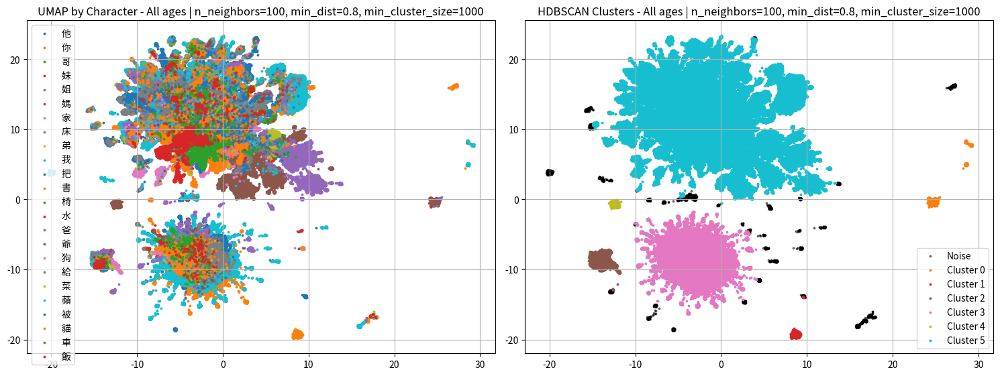


Cluster Examples for All ages | n_neighbors=100, min_dist=0.8, min_cluster_size=1000:

Noise Points (5267 points):
  蘋 [5]: 蘋果
  書 [4]: 書 櫃
  爸 [adult]: 我 不 知道 這 一 回 是不是 讓 爸爸 說 中 了
  我 [adult]: 我 實在 是 讓 這 幫 大 妖怪 折騰 壞 了
  我 [adult]: 同同 我們 在 樓 底下 食堂 吃 飯 啊 那 個 你 吃 那 個 肉絲 就 是 就 是 廚師 給 你
  他 [adult]: 牠 就 跑 到 這 個 池塘 裡 而且 牠 都 不 讓 其他 動物 在 這 池塘 游泳 啊 喝 水 啊 或 做 其他 的 事情
  他 [adult]: 我 不 想 讓 那裏 的 大 妖怪 覺得 我 原諒 他們 了
  我 [4]: 我 知道 了
  他 [adult]: 游泳 啊 或 做 其他 的 事情 那 凱麗 你 想 後來 會 發生 什麼 事
  給 [adult]: 同同 給 他們 畫 眼睛 吧
  我 [adult]: 我 不 想 讓 那裏 的 大 妖怪 覺得 我 原諒 他們 了
  我 [adult]: 我 知道 了
  我 [2]: 我 不 要
  我 [adult]: 我 不 知道 這 一 回 是不是 讓 爸爸 說 中 了
  你 [2]: 你 看看
  我 [adult]: 我 知道 了
  我 [4]: 我 不 要
  他 [adult]: 我 不 想 讓 那裏 的 大 妖怪 感覺 我 原諒 他們 了
  你 [adult]: 你 看看
  給 [5]: 給 你
  我 [adult]: 我 終於 讓 它們 見識 了 我 的 厲害
  他 [adult]: 可 他 說 的 不 對
  我 [adult]: 我 不 知道
  我 [adult]: 我 扛 起 垃圾 袋
  他 [adult]: 這 只 大 龍 啊 牠 就 跑 到 這 個 池塘 裡 而且 牠 不 讓 其他 動物 在 這 池塘 喝 水 啊 游泳 啊 或 做 其他
  ... and 5242 more

Cluster 0 (1498 points):
  我 [adult]: 我 知道
  媽 [3

(<Figure size 1500x600 with 2 Axes>,
 array([5, 5, 5, ..., 5, 5, 5]),
 {5: [{'utterance': '老爺 跳', 'character': '爺', 'age': '0'},
   {'utterance': '喊 爺爺 來 拔', 'character': '爺', 'age': '0'},
   {'utterance': '喊 爺爺 來 拔', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '還 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '還 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '海豹 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '海豹 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '啊 爺', 'character': '爺', 'age': '0'},
   {'utterance': '還有 爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '還有 爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '謝謝 爺爺', 'character': '爺', 'age': '0'},
   {'utteranc

In [58]:
# 3) Keep neighbors high, spread points more
plot_embeddings_umap_with_hdbscan(
    flat_char_embeddings,
    "All ages | n_neighbors=100, min_dist=0.8, min_cluster_size=1000",
    n_neighbors=100,
    min_dist=0.8,
    min_cluster_size=1000
)

/home/deborahwatty/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/tmp/ipykernel_8545/844036068.py:69: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


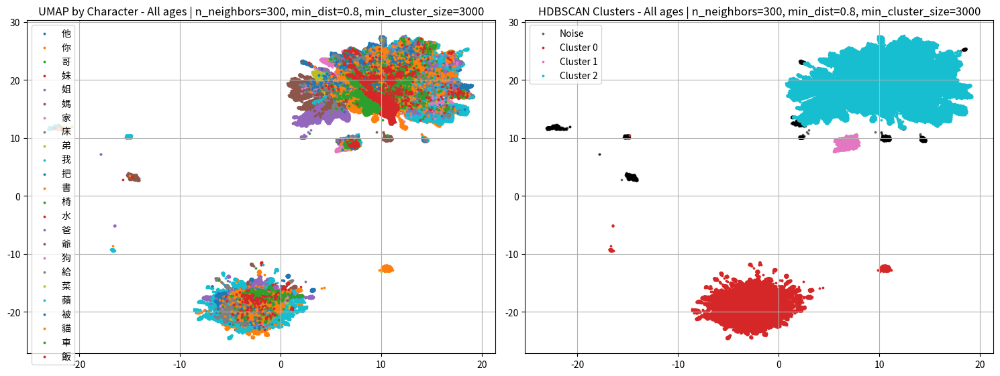


Cluster Examples for All ages | n_neighbors=300, min_dist=0.8, min_cluster_size=3000:

Noise Points (5246 points):
  我 [adult]: 吃 過 晚飯 考驗 我 的時候 到 了
  媽 [5]: 媽媽
  媽 [3]: 媽媽
  你 [adult]: 嘿 同同 你 真 棒
  媽 [5]: 媽媽
  爸 [4]: 爸爸 和 豬 媽媽 一起
  你 [adult]: 你 覺得
  我 [adult]: 我 就 知道
  爸 [adult]: 爸爸 只 好 穿 上 衣服 送 這 只 皮皮鼠 去 醫院
  媽 [adult]: 媽媽
  爸 [5]: 爸爸 媽媽 想 讓 它 去 認 字
  蘋 [5]: 蘋果
  蘋 [5]: 蘋果
  媽 [3]: 媽媽
  爸 [5]: 爸爸
  媽 [2]: 媽媽
  爸 [adult]: 爸爸 媽媽 對 剩下 的 三 只 皮皮鼠 說
  你 [2]: 你 教
  媽 [2]: 媽媽
  媽 [3]: 媽媽
  媽 [2]: 媽媽
  蘋 [6]: 蘋果
  爸 [6]: 爸爸 又 說 掉 了 一次 球 又 掉 了 次 飛機 不 好
  我 [5]: 我 不 知道
  爸 [adult]: 爸爸 啊 只好 穿 上 衣服 送 這 只 小 老鼠 到 醫院
  ... and 5221 more

Cluster 0 (102313 points):
  你 [adult]: 你 看 姐姐 不 跟 你 玩 了
  他 [adult]: 他們 準備 喝 飲料 了 是 嗎
  媽 [2]: 媽 我 騙 你 的 啦
  你 [adult]: 你 不 說 這 個 難 嗎
  他 [adult]: 他 他 說 什麼
  我 [adult]: 我們 倆 考 得 好 的話 就 能 得 第一 名
  他 [5]: 他 就 去 一 個
  你 [adult]: 你 看 我 變成 巴度 了
  他 [3]: 他 是 讓 這 讓 這些 過 的
  你 [adult]: 你 吃 甘蔗 好不好
  把 [4]: 把 我們 的 這 個 都 弄 亂 了
  我 [adult]: 我 實在 讓 這 幫 大 妖怪 折騰 夠 了
  爸 [adult]: 

(<Figure size 1500x600 with 2 Axes>,
 array([2, 2, 2, ..., 2, 2, 2]),
 {2: [{'utterance': '老爺 跳', 'character': '爺', 'age': '0'},
   {'utterance': '喊 爺爺 來 拔', 'character': '爺', 'age': '0'},
   {'utterance': '喊 爺爺 來 拔', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '還 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '還 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '海豹 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '海豹 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '啊 爺', 'character': '爺', 'age': '0'},
   {'utterance': '還有 爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '還有 爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '謝謝 爺爺', 'character': '爺', 'age': '0'},
   {'utteranc

In [59]:
# 4) Very aggressive smoothing (expect few clusters, more noise)
plot_embeddings_umap_with_hdbscan(
    flat_char_embeddings,
    "All ages | n_neighbors=300, min_dist=0.8, min_cluster_size=3000",
    n_neighbors=300,
    min_dist=0.8,
    min_cluster_size=3000
)


/home/deborahwatty/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/umap/spectral.py:548: UserWarning: Spectral initialisation failed! The eigenvector solver
failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deborahwa

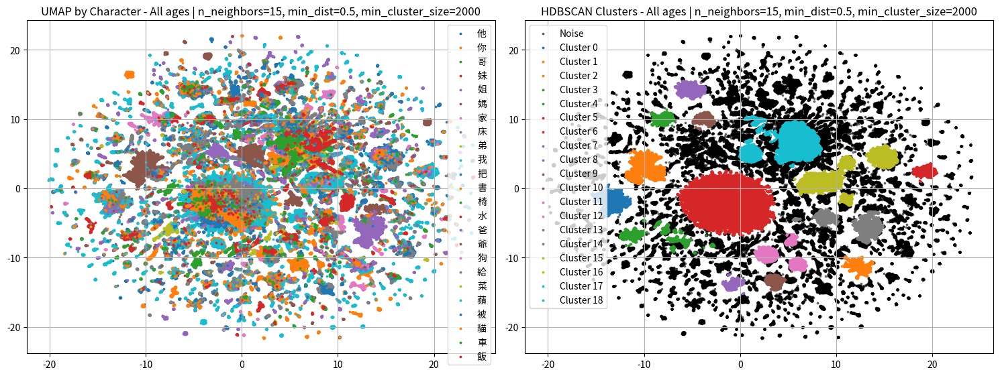


Cluster Examples for All ages | n_neighbors=15, min_dist=0.5, min_cluster_size=2000:

Noise Points (149015 points):
  他 [adult]: 讓 他 爸爸 要 保護 他 對不對
  被 [adult]: 你 有沒有 被 什麼 東西 嚇 到 過
  我 [6]: 最後 那 個 大象 女孩 說 不 小心 我 從 他 的 手 上 我 從 他 的 手 上 搶 過來 不 小心 扔 到 水
  給 [5]: 就 給 小 豬 吃
  你 [adult]: 弟弟 你 看 你 有 翅膀 了
  姐 [3]: 柳樹 姐姐
  我 [adult]: 我們 家 裡 沒 我們 家 那個 沒 花生
  我 [adult]: 昨天 我 在 打掃 房間 的時候 啊 突然 有 一 只 蟑螂 爬 到 我 腳 上 耶 嚇 了 我 一 大 跳
  水 [adult]: 沒 水 啊 哪裏 有 水 呢 衛生間 有沒有 水 呢
  他 [8]: 可是 他 自己 也 有
  給 [6]: 幫 他 飛機 拿 拿 了 長頸鹿 給
  把 [6]: 很 快 的 城堡 的 故事 傳 開 了 每 天 都 有 人 把 小孩 帶 到 三 個 強盜 的 門
  菜 [adult]: 沒有 菜
  你 [adult]: 樓梯 裝 在 哪裏 比較 合適 你 覺得
  貓 [adult]: 有 貓咪 嗎
  我 [4]: 我 想 我 想 放 在 這兒
  你 [adult]: 是 去 找 你 是 如果 你 已經 看 到 一 片 拼圖 你 就 趕快 把 他 拼 上去
  貓 [adult]: 嗯 這 個 名字 特別 好 天使 貓 對 吧
  蘋 [7]: 蘋果
  飯 [4]: 吃飯 的 地方
  你 [adult]: 你 有沒有 把 東西 打翻 過
  爸 [4]: 我 爸爸 不 能 出去 孩子
  書 [adult]: 然後 呢 自己 翻 著 書 來講 一邊 翻 書 一邊 講 然後 怎麼樣
  我 [adult]: 可 當 我 一 個 人 在 家 的時候 屋子 裡 就 變 得 好 安靜
  媽 [adult]: 啊 熊 媽媽 說
  ... and 148990 more

Cluster 0 (7396 point

(<Figure size 1500x600 with 2 Axes>,
 array([17, -1, -1, ..., -1, -1, -1]),
 {17: [{'utterance': '老爺 跳', 'character': '爺', 'age': '0'},
   {'utterance': '老 爺爺', 'character': '爺', 'age': '2'},
   {'utterance': '有 嘞 爺爺 奶奶 去 看 歌仔戲 歌仔戲', 'character': '爺', 'age': '2'},
   {'utterance': '老爺爺', 'character': '爺', 'age': '3'},
   {'utterance': '大 樹 爺爺', 'character': '爺', 'age': '3'},
   {'utterance': '老爺 噴 空 車', 'character': '爺', 'age': '3'},
   {'utterance': '是 我 爺爺 奶奶 買 的', 'character': '爺', 'age': '3'},
   {'utterance': '空心 奶奶 空心 爺爺 空心 爸爸 哈哈', 'character': '爺', 'age': '4'},
   {'utterance': '看 呀 看 蟹 腳 爺爺 蟹 腳', 'character': '爺', 'age': '4'},
   {'utterance': '幫 我 拿 筷子 爺爺', 'character': '爺', 'age': '4'},
   {'utterance': '爺爺 真 長壽', 'character': '爺', 'age': '4'},
   {'utterance': '哥哥 哥哥 白 爺爺', 'character': '爺', 'age': '4'},
   {'utterance': '然後 我 爺爺 早上 四 點 六 點 的時候 就 起來', 'character': '爺', 'age': '5'},
   {'utterance': '可是 因為 我 爺爺 下班 回來 以前 下班 回來 都 都 會 帶 玩具 回來 給 我 玩',
    'character': '爺',
    'a

In [60]:
# 5) Control: same UMAP, stricter HDBSCAN only
plot_embeddings_umap_with_hdbscan(
    flat_char_embeddings,
    "All ages | n_neighbors=15, min_dist=0.5, min_cluster_size=2000",
    n_neighbors=15,
    min_dist=0.5,
    min_cluster_size=2000
)

/home/deborahwatty/.local/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/deborahwatty/.local/lib/python3.10/site-packages/sklearn/utils/deprecation.py:132: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/tmp/ipykernel_8545/844036068.py:69: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


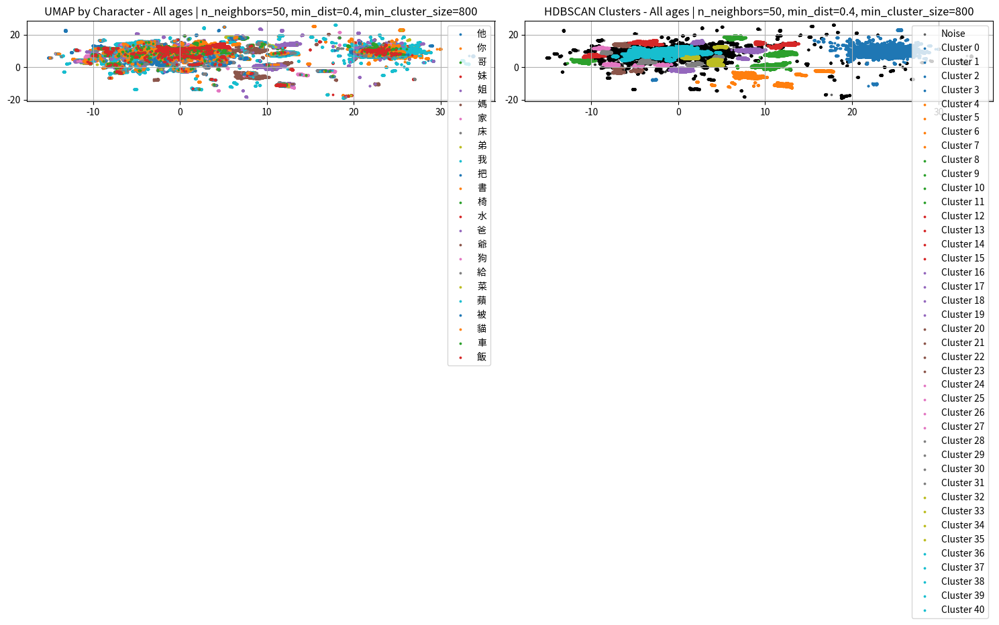


Cluster Examples for All ages | n_neighbors=50, min_dist=0.4, min_cluster_size=800:

Noise Points (64858 points):
  我 [adult]: 正好 我 看 到 了 空手道 培訓 的 廣告
  家 [adult]: 媽媽 在 家 的時候 它們 都 會 躲 起來
  你 [adult]: 你 告訴 大家 你 喜不喜歡 頡頡 哥哥
  你 [adult]: 媽媽 以前 不 帶 你 去 過 的 嗎 水果 店
  我 [5]: 我 我 來 我 來
  你 [adult]: 那 需要 幫忙 你 再 跟 我 說
  貓 [5]: 小 貓咪 想 了 想 說
  把 [5]: 它 接著 把 這 個 南瓜 種 進去
  狗 [adult]: 那 你 比較 喜歡 吃 紅蘿蔔 還是 狗狗 比較 喜歡 吃 紅蘿蔔
  把 [6]: 然後 它 這 只 貓 把 主人 的 沙發 也 搞 爛 了
  爸 [adult]: 還是 爸爸 媽媽 有沒有 打翻 過 東西
  他 [5]: 然後 呢 他 的 爸爸 他 的 孩子
  你 [adult]: 媽媽 被 你
  我 [4]: 有 我 在 我 家 裡 見 過
  我 [adult]: 長大 以後 說不定 我們 專門 去 抓 大 妖怪
  你 [adult]: 那 你 媽媽 有沒有 帶 你 去 游泳池
  你 [adult]: 不然 你 看
  貓 [adult]: 吶 大 熊貓 看
  貓 [adult]: 你 覺得 小 貓 貓 挺 可愛的 啊
  被 [adult]: 那 你 有沒有 記得 誰 誰 被 東 像 你 媽媽 有沒有 被 嚇 到 過
  床 [5]: 該 起床 了
  家 [adult]: 嗯 對 這 大家 排隊 在 買 票
  他 [5]: 給 他 鼻鼻 吃 藥
  我 [adult]: 洗 完 澡 我 飛 身 躍進 我 的 房間
  蘋 [3]: 吃 起來 就 像 蘋果 香 甜
  ... and 64833 more

Cluster 0 (1194 points):
  媽 [5]: 媽媽
  媽 [4]: 媽媽
  媽 [2]: 媽媽
  媽 [1]: 媽媽
  媽 [2]: 媽媽
  媽 [2]: 媽媽
  媽 [3

(<Figure size 1500x600 with 2 Axes>,
 array([-1, 39, -1, ..., 39, 39, 39]),
 {-1: [{'utterance': '老爺 跳', 'character': '爺', 'age': '0'},
   {'utterance': '喊 爺爺 來 拔', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '還 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '海豹 要 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '啊 爺', 'character': '爺', 'age': '0'},
   {'utterance': '還有 爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺 啊', 'character': '爺', 'age': '0'},
   {'utterance': '謝謝 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '謝謝 爺爺', 'character': '爺', 'age': '0'},
   {'utterance': '吃 老爺爺 吃 阿姨', 'character': '爺', 'age': '0'},
   {'utterance': '吃 老爺爺 吃 阿姨', 'character': '爺', 'age': '0'},
   {'utterance': '爺爺', 'character': '爺', 'age': '1'},
   {'ut

In [61]:
# 6) Moderate global view, moderate clusters
plot_embeddings_umap_with_hdbscan(
    flat_char_embeddings,
    "All ages | n_neighbors=50, min_dist=0.4, min_cluster_size=800",
    n_neighbors=50,
    min_dist=0.4,
    min_cluster_size=800
)